# Строим решение для случая с плоской границей

In [1]:
# для того, чтобы скрипты гладко работали на https://colab.research.google.com/ пропишем
# установку библиотеки anaflow которую будем использовать для обратного преобразования Лапласа
!pip install anaflow

In [2]:
!pip install welltest

In [3]:
# импортируем библиотки, которые могут пригодиться для проведения расчетов
import numpy as np
import matplotlib.pyplot as plt
from anaflow import get_lap_inv
from scipy.special import kn, iv, expi

import welltest.functions as wf

In [22]:
def pd_ei(td, rd):
    return -0.5 * expi(-rd**2/4/td)

# пример функции реализующий расчет решения в пространстве Лапласа
def pd_lapl_finite_rw(u, rd=1):
    """
    расчет решения c конечным радиусом скважины для безразмерного давления в пространстве Лапласа
    u - переменная пространства Лапласа
    rd- безразмерное расстояние от центра скважины
    """
    return 1 / u**(3/2) * kn(0, rd * u**0.5) / kn(1, u**0.5)

In [5]:
# решение линейного стока в пространстве Лапласа
def pd_lapl_wbs(pd_lapl, S=0, Cd=0):
    def pdl(s, rd=1, S=0, Cd=0):
        return 1 / s * (S + s * pd_lapl(s, rd=rd)) / (1 + s * Cd * (S + s * pd_lapl(s, rd=rd)))
    return pdl

# построим функцию инвертирующую решение в пространстве Лапласа

# функция расчета безразмерного давления с использованием алгоритма Стефеста
# для численного обратного преобразования Лапласа
def pd_inv(pd_lapl, td, rd, **kwargs):
     
    
    if isinstance(rd, np.ndarray):
        # если на входе массив, то вручную итерируем по всем элементам и 
        # собираем массив массивов
        return np.array(list(map(lambda r: pd_inv(pd_lapl, td, rd=r, **kwargs), rd)))
    else:
        pd_inv_ = get_lap_inv(pd_lapl, rd=rd, **kwargs)
        return pd_inv_(td)

In [7]:
# определим функцию которая строит решение с учетом влияния ствола скважины
pd_inf = pd_lapl_wbs(pd_lapl_finite_rw, S=5, Cd = 1e-3)


NameError: name 'td_arr' is not defined

In [9]:
# пример вызова обратного преобразования Лапласа для построенного решения
pd_arr_inf = pd_inv(pd_inf, td=1, rd=1, S=0, Cd=0)

In [29]:
# зададим координатную сетку
x = np.linspace(-500, 500, 500)
y = np.linspace(-500, 500, 500)

In [30]:
xv, yv = np.meshgrid(x, y)

In [50]:
xwell1 = 100
ywell1 = -250

In [51]:
pdmesh = pd_ei(td=100000,rd= ((xv-xwell1)**2 + (yv-ywell1)**2)**0.5 )

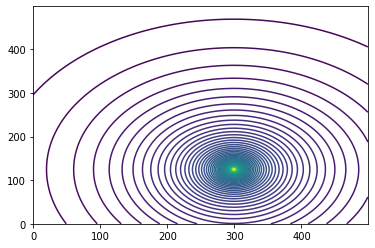

In [52]:
plt.contour(pdmesh, levels=100)
plt.show()

In [54]:
xwell1 = -100
ywell1 = 0

xwell2 = 100
ywell2 = 0

In [57]:
pdmesh = (pd_ei(td=100000,rd= ((xv-xwell1)**2 + (yv-ywell1)**2)**0.5 ) + 
          pd_ei(td=100000,rd= ((xv-xwell2)**2 + (yv-ywell2)**2)**0.5 ))

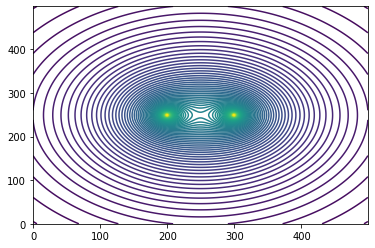

In [58]:
plt.contour(pdmesh, levels=100)
plt.show()

In [59]:
import plotly.express as px

In [60]:
import plotly.graph_objects as go

In [64]:
fig = go.Figure(data=[go.Surface(z=pdmesh)])

fig.update_layout(title='pd surface',
                  width=500, height=500)

fig.show()